# Diffuser에서 stable-diffusion 사용하기

### 간단한 조작

In [1]:
from diffusers import StableDiffusionPipeline
import torch
torch.cuda.empty_cache()  # 미사용 캐시된 메모리 해제
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4")
pipe.to('cuda') # cuda로 옮기면 memory를 많이 사용하게 된다.

/home/qkboo/.pyenv/versions/3.12.1/envs/Goodyoung_P312/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Loading pipeline components...: 100%|██████████| 7/7 [00:00<00:00, 12.93it/s]


100%|██████████| 50/50 [00:06<00:00,  7.19it/s]


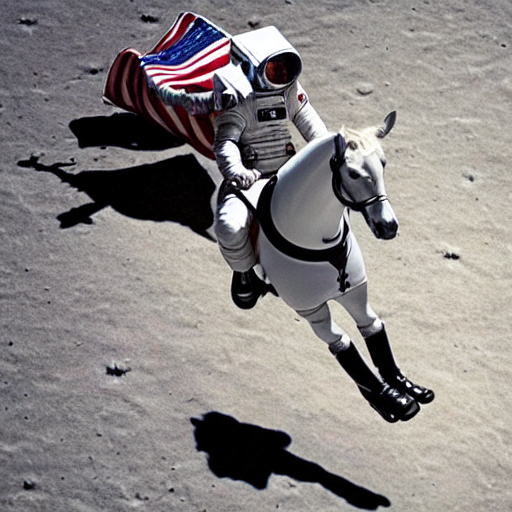

In [4]:
prompt = "a photograph of an astronaut riding a horse"
image = pipe(prompt).images[0]
image

100%|██████████| 15/15 [00:02<00:00,  7.15it/s]


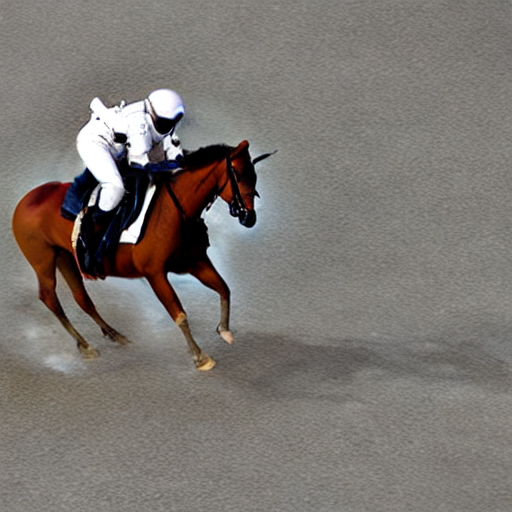

In [7]:
generator = torch.Generator("cuda").manual_seed(0) # seed 동일하게 하게 싶을 때

image = pipe(prompt, guidance_scale=8.0, num_inference_steps=200, generator=generator).images[0] # num_inference_steps 높아지면 높아질 수록 좋다
image

### 여러 이미지를 만들 경우

In [4]:
def get_inputs(batch_size=1):
    generator = [torch.Generator("cuda").manual_seed(i) for i in range(batch_size)]
    prompts = batch_size * [prompt]
    num_inference_steps = 20

    return {"prompt": prompts, "generator": generator, "num_inference_steps": num_inference_steps}

100%|██████████| 20/20 [02:18<00:00,  6.91s/it]


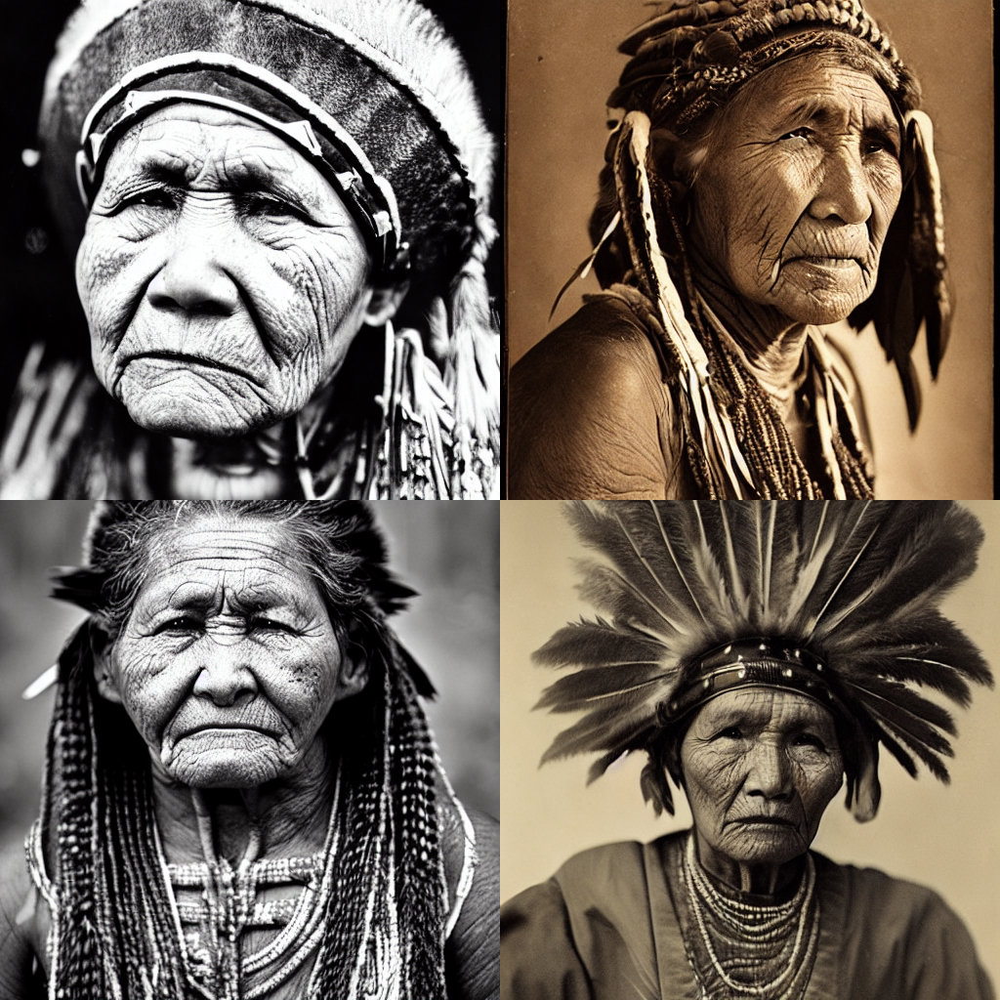

In [15]:
from diffusers.utils import make_image_grid
prompt = "portrait photo of a old warrior chief"
images = pipe(**get_inputs(batch_size=4)).images
make_image_grid(images, 2, 2)

### 메모리 더욱 절약할 경우
- 더 많은 vRAM이 있는 GPU가 없다면, 위의 코드는 아마도 오류를 반환한다.
- 대부분의 메모리는 크로스 어텐션 레이어에서 차지한다. 따라서 아래의 함수를 사용하여 작업을 일괄로 실행하는 대신 순차적으로 실행하여 메모리를 절약할 수 있다.
- 없다면 배치 크기로 인하여 **오류가 난다**

100%|██████████| 20/20 [00:22<00:00,  1.15s/it]


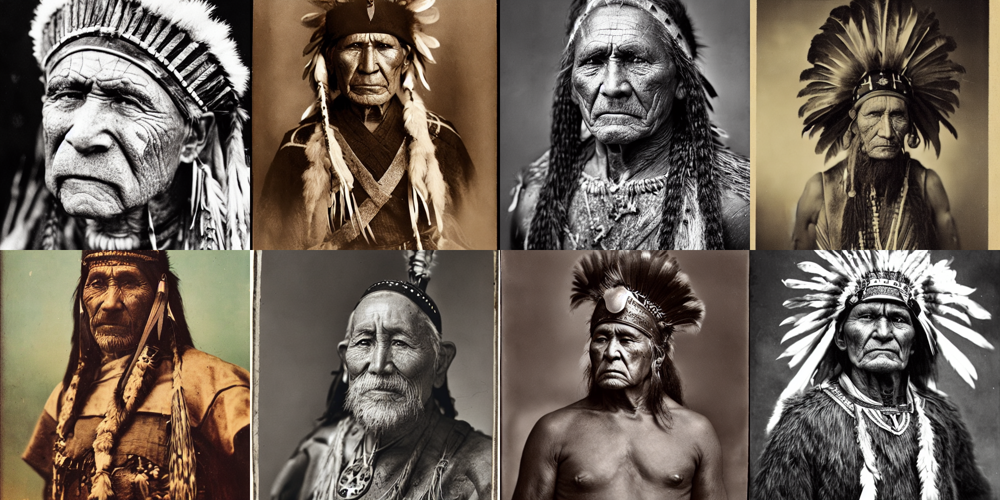

In [11]:
prompt = "portrait photo of a old warrior chief"

pipe.enable_attention_slicing() # attention layer에서  gpu 할당을 순차적으로 진행하게 함
images = pipe(**get_inputs(batch_size=8)).images
make_image_grid(images, rows=2, cols=4)

### 추가적인 프롬프트 엔지니어링을 통한 사진 개선

100%|██████████| 20/20 [00:22<00:00,  1.14s/it]


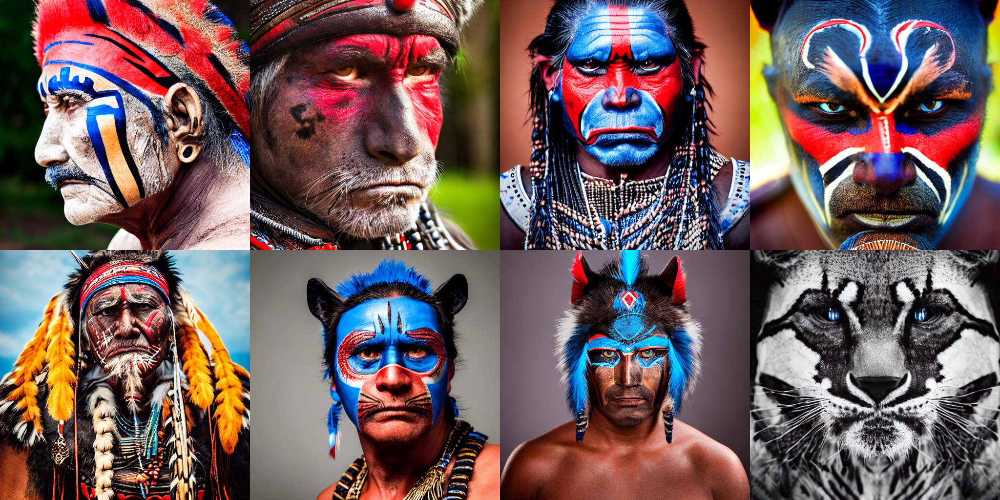

In [16]:
prompt += ", tribal panther make up, blue on red, side profile, looking away, serious eyes"
prompt += " 50mm portrait photography, hard rim lighting photography--beta --ar 2:3  --beta --upbeta"
images = pipe(**get_inputs(batch_size=8)).images
make_image_grid(images, rows=2, cols=4)